In [1]:
import os
import sys
from glob import glob
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from collections import defaultdict
from utils import label_map_util
from utils import visualization_utils as vis_util
import random

%matplotlib inline

In [2]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return graph


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

In [3]:
## F_RCNN V2 - real data - 10000 steps - faster_rcnn_inception_v2_coco_2018_01_28
PATH_TO_GRAPH = r'models/faster_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb' ## load SSD trained on udacity's parking lot images
PATH_TO_LABELS = r'data/udacity_label_map.pbtxt'
NUM_CLASSES = 4

In [4]:
detection_graph = load_graph(PATH_TO_GRAPH)

In [5]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Red'}, 3: {'id': 3, 'name': 'Yellow'}, 4: {'id': 4, 'name': 'off'}}


In [6]:
IMAGE_SIZE = (12, 8)

SCORES
[9.9618930e-01 6.1004190e-03 4.5803306e-03 1.3974189e-03 1.1610534e-03
 8.2654553e-04 7.8699330e-04 4.9006933e-04 6.4288194e-08 1.2021857e-11]
CLASSES
[2. 1. 3. 4. 4. 3. 4. 4. 4. 4.]


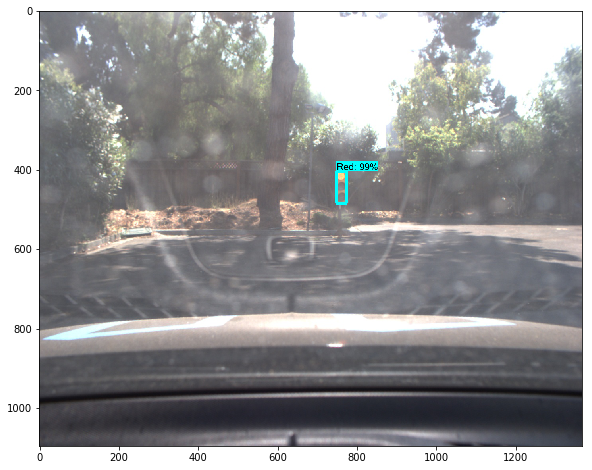

SCORES
[9.3514949e-01 5.4058947e-02 3.9326128e-02 7.6642339e-03 2.1569156e-03
 1.5971297e-08 8.1325773e-09 7.9236360e-09 3.1877589e-09 2.0532236e-09]
CLASSES
[2. 1. 3. 4. 4. 4. 4. 1. 2. 4.]


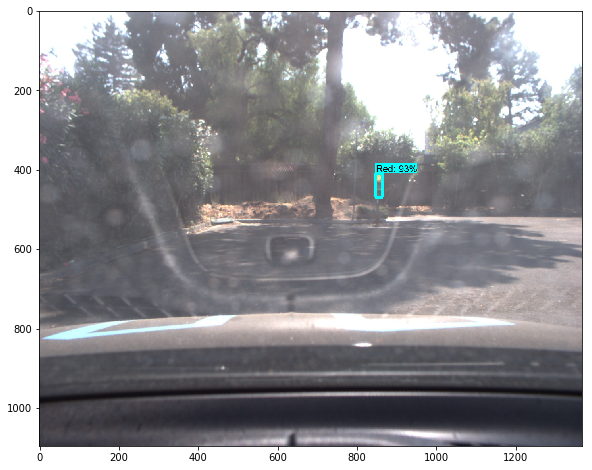

SCORES
[9.9941146e-01 1.8421954e-03 1.6137669e-03 6.8031531e-04 6.7381770e-04
 5.5340573e-04 9.2498609e-05 8.3445164e-05 3.9347415e-07 6.2867052e-08]
CLASSES
[1. 3. 2. 4. 3. 4. 4. 4. 4. 4.]


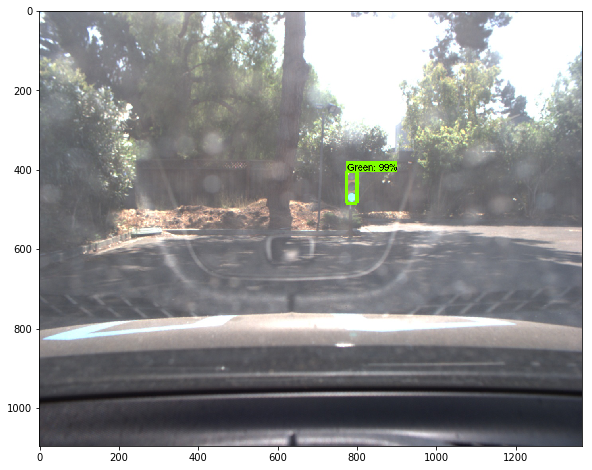

SCORES
[9.9889684e-01 1.2257275e-02 7.6949503e-03 3.5364802e-03 4.1489265e-04
 1.0780889e-04 5.1811458e-06 4.5792694e-07 2.5368323e-07 2.6425974e-08]
CLASSES
[1. 2. 3. 4. 4. 4. 1. 1. 4. 4.]


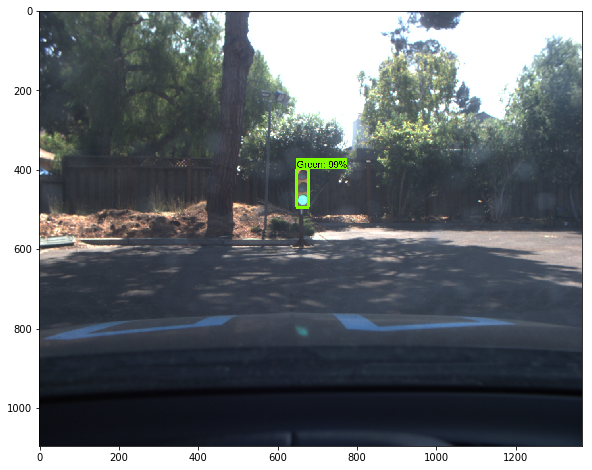

SCORES
[9.9634856e-01 7.3845130e-03 6.8485904e-03 1.2734131e-03 1.2637202e-03
 1.0800936e-03 9.0867991e-04 6.6288875e-04 1.5929039e-05 5.9790536e-06]
CLASSES
[2. 3. 1. 4. 4. 4. 3. 4. 4. 4.]


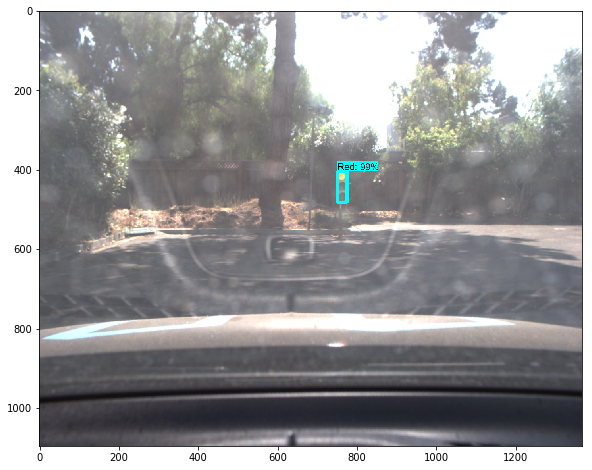

SCORES
[9.9828124e-01 4.6793809e-03 3.1446542e-03 1.5646474e-03 4.5037238e-04
 3.2787857e-04 2.9817739e-04 1.1746932e-04 9.2927832e-05 2.3733537e-05]
CLASSES
[2. 3. 1. 4. 3. 4. 4. 4. 4. 4.]


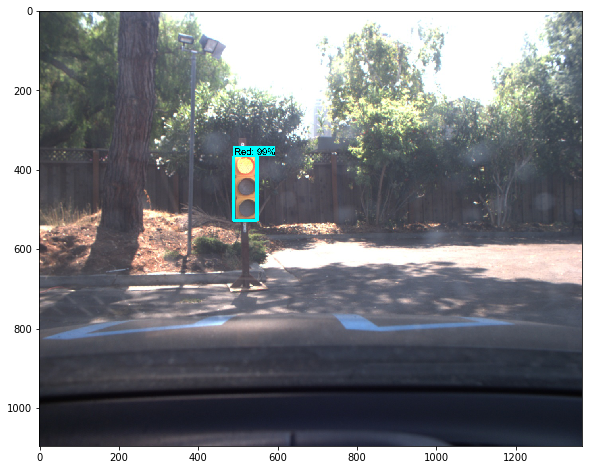

SCORES
[9.9818784e-01 4.2832000e-03 1.9894596e-03 1.9700360e-03 1.5047463e-03
 9.4544503e-04 5.3016085e-04 2.8025286e-04 7.9734767e-05 6.7121517e-05]
CLASSES
[2. 1. 3. 4. 4. 3. 4. 4. 4. 4.]


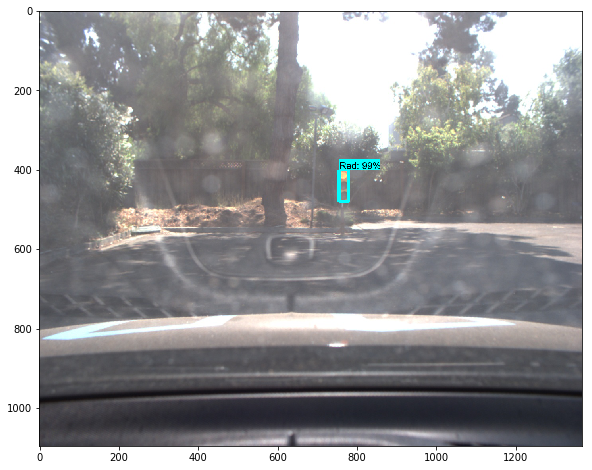

SCORES
[9.99288380e-01 2.78724311e-03 2.54549715e-03 9.83237405e-04
 5.05825563e-04 3.29525821e-04 2.02277835e-04 1.82602744e-04
 1.56947441e-04 1.08615706e-04]
CLASSES
[1. 3. 2. 4. 3. 4. 3. 4. 4. 4.]


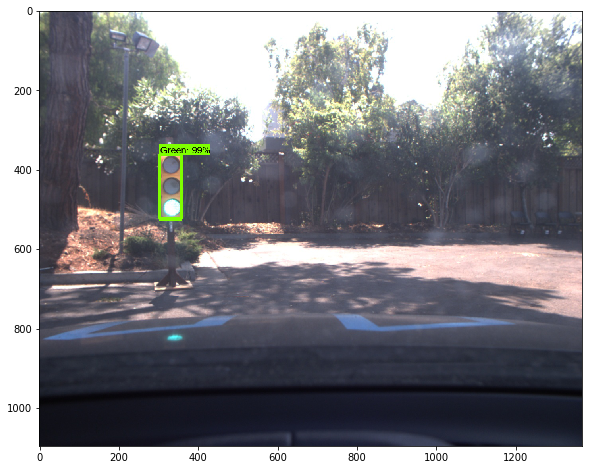

SCORES
[9.9926764e-01 2.4308844e-02 3.8367840e-03 3.0847425e-03 2.0343841e-03
 5.5998593e-04 5.2367605e-04 3.4618500e-04 1.4210401e-04 1.2357064e-04]
CLASSES
[1. 2. 3. 3. 4. 4. 4. 4. 3. 4.]


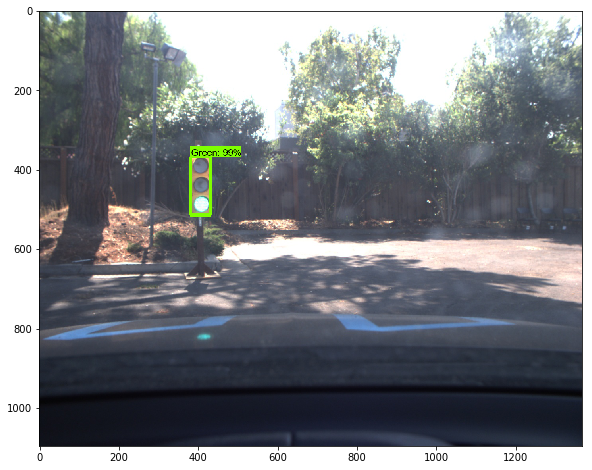

SCORES
[8.6973554e-01 1.2324075e-01 3.0496137e-02 5.7355394e-03 5.2365009e-04
 1.1767933e-04 1.0576199e-05 2.7156148e-06 4.9477757e-07 3.9330433e-07]
CLASSES
[2. 1. 3. 4. 4. 4. 4. 1. 3. 4.]


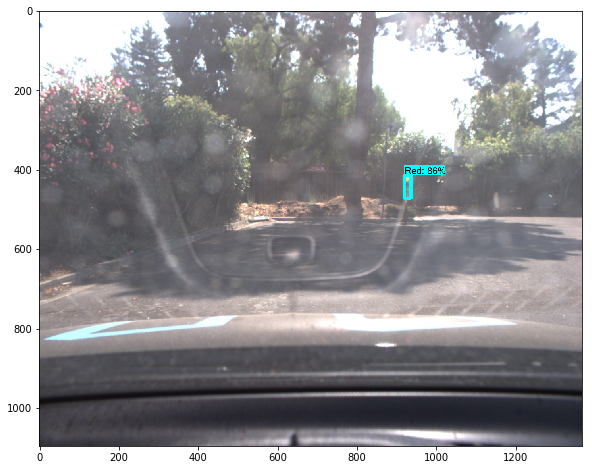

SCORES
[9.9899942e-01 7.7856090e-03 7.1750316e-03 1.3623487e-03 8.7838474e-04
 8.2276110e-04 4.0553874e-04 4.2512979e-06 1.5827578e-07 1.5649098e-07]
CLASSES
[1. 2. 3. 4. 4. 3. 4. 4. 4. 2.]


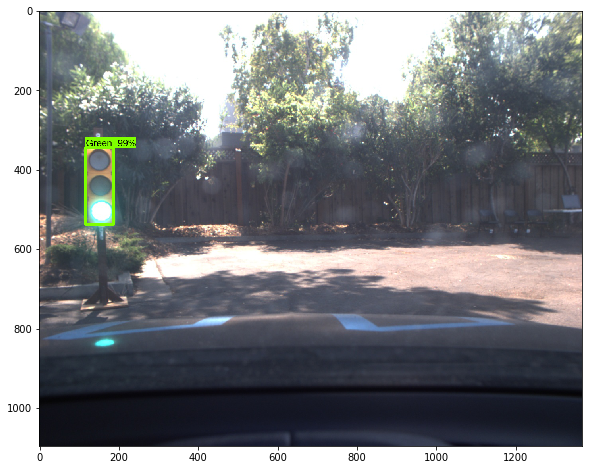

In [7]:
# Test on real data from udacity testing parking lot.
PATH_TO_IMGS = r'data/udacity_testarea_rgb'
TEST_IMGS = glob(os.path.join(PATH_TO_IMGS, r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            random.shuffle(TEST_IMGS)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break

In [8]:
# Model: SSD Inception V2 Coco on Udacity real data - 20000 steps
PATH_TO_GRAPH = r'models/ssd_inception_v2_coco_2017_11_17/real/frozen_inference_graph.pb' ## load SSD trained on udacity's simulator images
detection_graph = load_graph(PATH_TO_GRAPH)

SCORES
[0.7712799  0.00300894 0.0024463  0.00204705 0.00201956 0.00201387
 0.00198921 0.00197469 0.00194381 0.00191571]
CLASSES
[1. 4. 3. 2. 4. 2. 4. 2. 2. 4.]


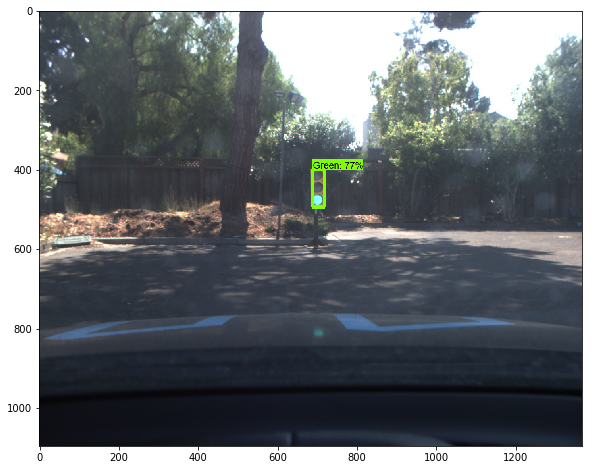

SCORES
[0.8588     0.00453292 0.00345154 0.00280561 0.0024999  0.00248735
 0.00223475 0.00222749 0.00221003 0.00220285]
CLASSES
[1. 1. 4. 3. 1. 4. 4. 1. 1. 4.]


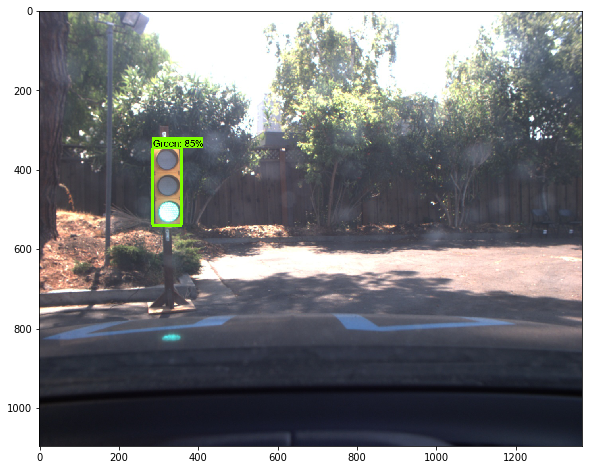

SCORES
[0.13101551 0.01801307 0.01121959 0.00894282 0.00601616 0.00423401
 0.00409192 0.00274016 0.00254098 0.00244838]
CLASSES
[3. 2. 3. 1. 1. 1. 4. 1. 3. 1.]


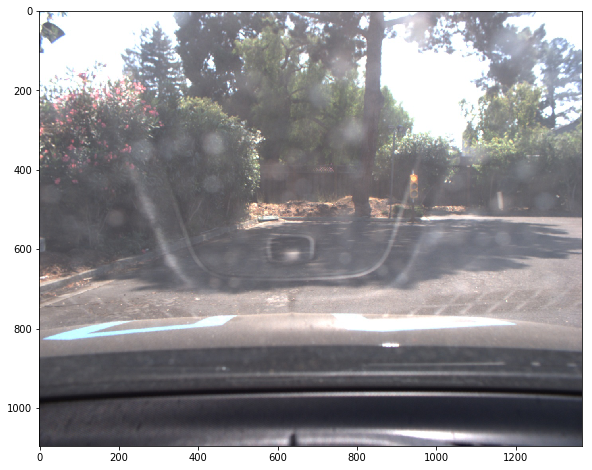

SCORES
[0.99673706 0.00249249 0.00242731 0.00209474 0.002092   0.00204772
 0.00201988 0.0020125  0.00200099 0.00192723]
CLASSES
[1. 4. 4. 4. 1. 1. 3. 2. 4. 4.]


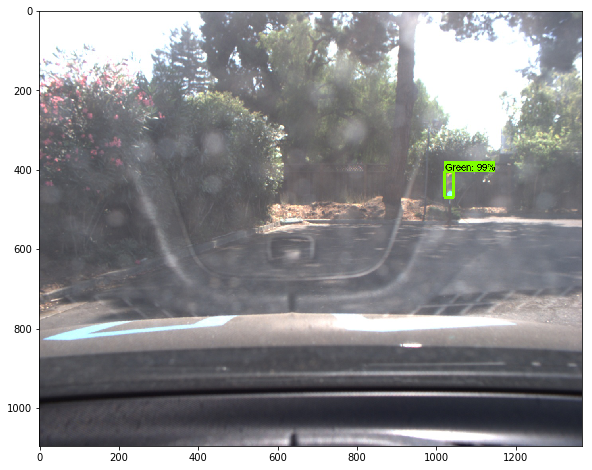

SCORES
[0.6394735  0.01090979 0.00252925 0.00229445 0.00221522 0.00219372
 0.00212682 0.00210488 0.00203776 0.00199217]
CLASSES
[2. 3. 4. 4. 4. 1. 4. 2. 1. 3.]


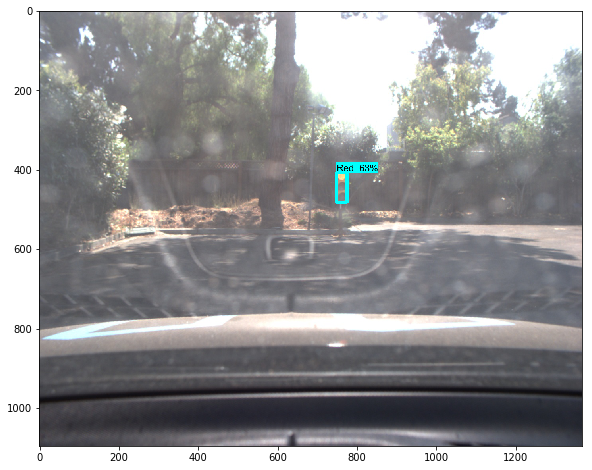

SCORES
[0.9988607  0.00435778 0.00416831 0.00413551 0.00372543 0.00339397
 0.00329217 0.00301362 0.00299007 0.00292138]
CLASSES
[1. 1. 3. 3. 1. 4. 3. 4. 3. 3.]


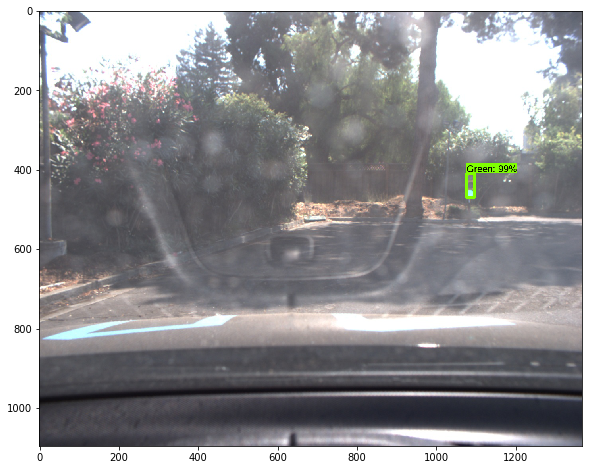

SCORES
[0.96997976 0.01609991 0.01587071 0.00403254 0.00278694 0.00263709
 0.00253202 0.0024743  0.0023991  0.00236   ]
CLASSES
[1. 1. 1. 1. 1. 1. 3. 4. 4. 4.]


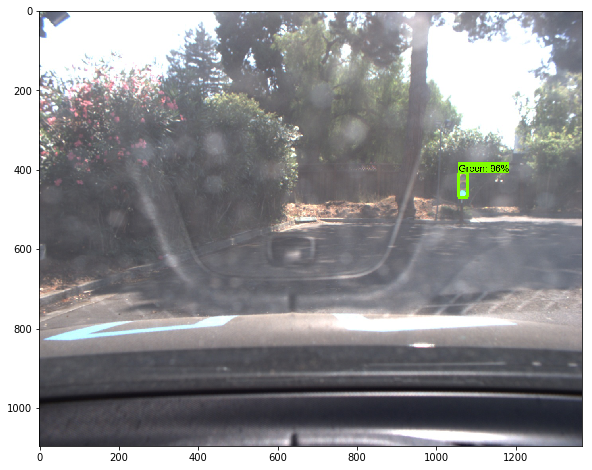

SCORES
[0.9912225  0.00470896 0.00230299 0.00212512 0.00204723 0.00201171
 0.00199592 0.00192186 0.00191845 0.00187014]
CLASSES
[2. 4. 4. 1. 3. 4. 4. 1. 1. 4.]


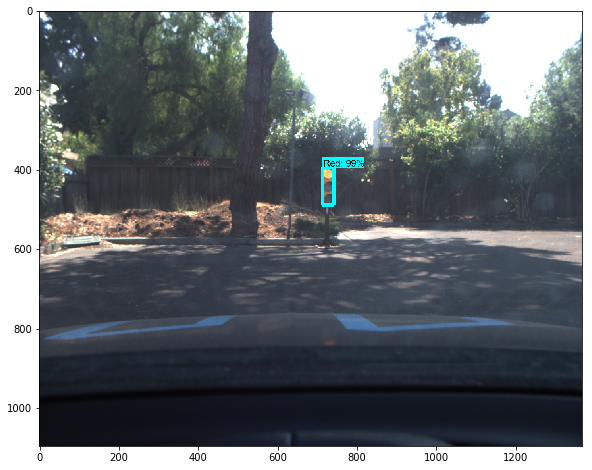

SCORES
[0.8746146  0.0086084  0.00511853 0.00453504 0.00368293 0.00296687
 0.00282246 0.00256213 0.00253133 0.00244243]
CLASSES
[1. 3. 1. 2. 4. 4. 4. 1. 4. 4.]


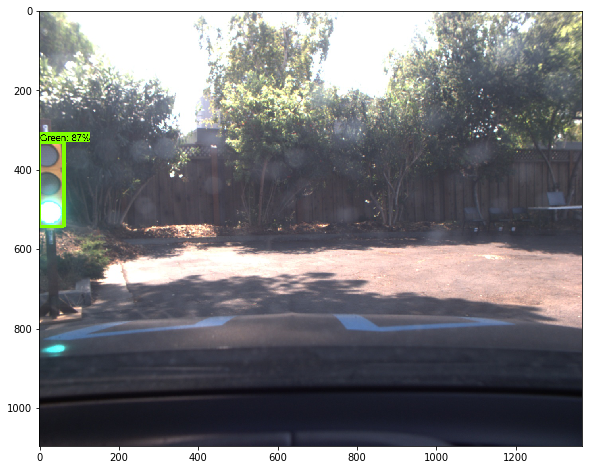

SCORES
[0.23140676 0.21710545 0.08100661 0.00298684 0.00256422 0.00230489
 0.00227333 0.00218644 0.00216352 0.00215364]
CLASSES
[2. 1. 3. 2. 4. 4. 4. 4. 1. 4.]


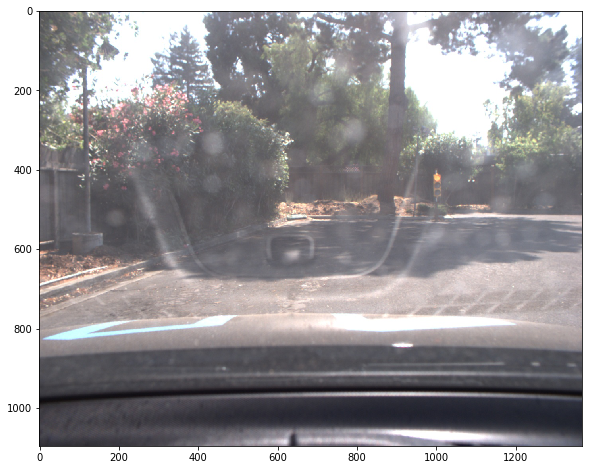

SCORES
[0.9989378  0.00286988 0.00225642 0.00222409 0.00217446 0.002129
 0.00211605 0.00204537 0.00202274 0.00201495]
CLASSES
[1. 3. 1. 1. 1. 2. 1. 3. 4. 4.]


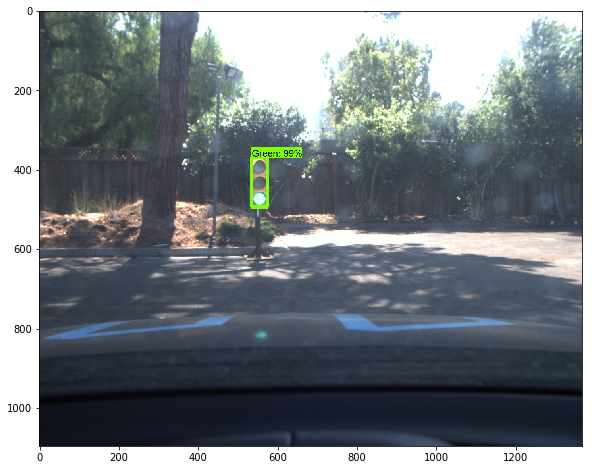

In [9]:
# Test on real data from udacity testing parking lot.
PATH_TO_IMGS = r'data/udacity_testarea_rgb'
TEST_IMGS = glob(os.path.join(PATH_TO_IMGS, r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            random.shuffle(TEST_IMGS)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break

In [10]:
# Model: SSD Inception V2 Coco on Udacity simulator data - 20000 steps
PATH_TO_GRAPH = r'models/ssd_inception_v2_coco_2017_11_17/sim/frozen_inference_graph.pb' ## load SSD trained on udacity's simulator images
detection_graph = load_graph(PATH_TO_GRAPH)

SCORES
[0.99976164 0.99970895 0.00670713 0.00541189 0.0049202  0.00489005
 0.00453802 0.00453542 0.00449151 0.00421728]
CLASSES
[2. 2. 2. 2. 1. 3. 1. 4. 4. 3.]


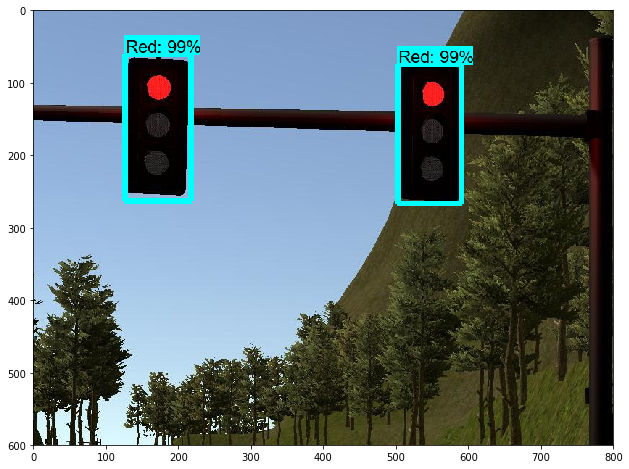

SCORES
[0.9997842  0.9993217  0.9979164  0.00585902 0.00523127 0.00514064
 0.00450538 0.0041467  0.00389584 0.00369385]
CLASSES
[1. 1. 1. 1. 1. 1. 4. 4. 1. 1.]


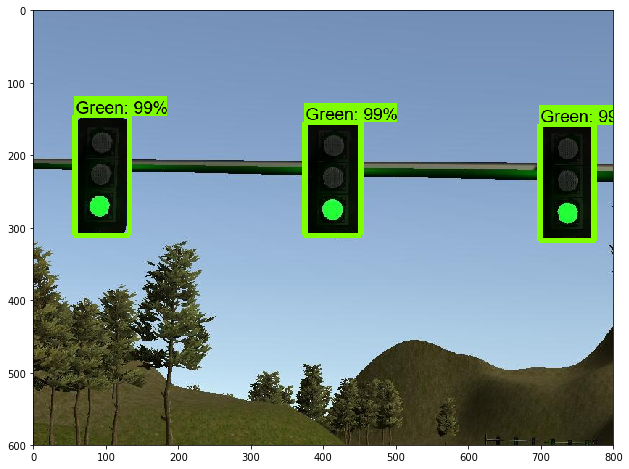

SCORES
[0.99886453 0.9961966  0.99602926 0.00665478 0.0045397  0.00451165
 0.004168   0.00403905 0.00363813 0.00358603]
CLASSES
[1. 1. 1. 1. 1. 1. 1. 1. 4. 4.]


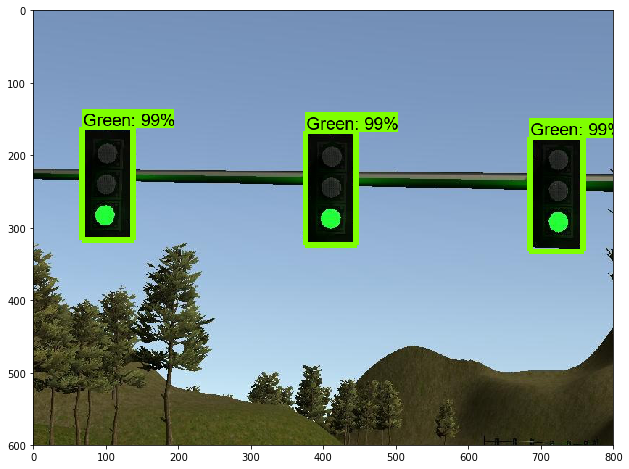

SCORES
[0.708986   0.44085166 0.42765978 0.00690456 0.00580065 0.00530274
 0.00511335 0.00486969 0.00475878 0.00453798]
CLASSES
[2. 2. 2. 1. 3. 2. 3. 3. 4. 3.]


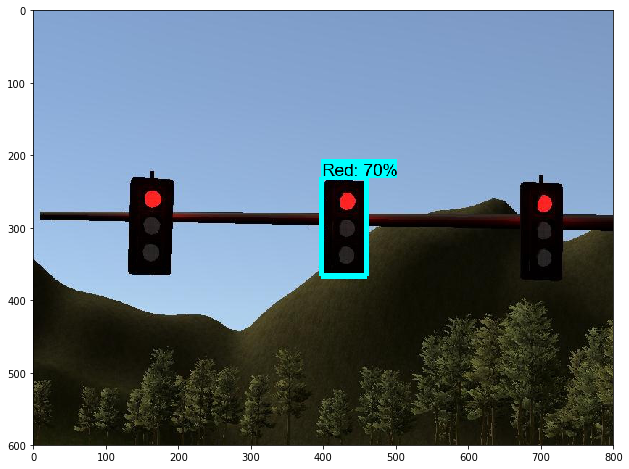

SCORES
[0.89157426 0.6824192  0.55234814 0.00639901 0.00622589 0.00557762
 0.00557045 0.00527774 0.00507188 0.00506358]
CLASSES
[2. 2. 2. 2. 2. 2. 2. 3. 4. 3.]


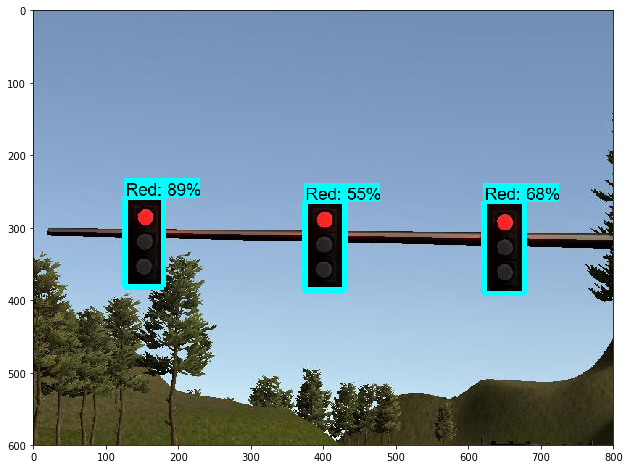

SCORES
[0.87526095 0.69240636 0.5437745  0.00630228 0.00570081 0.005602
 0.00543167 0.00515353 0.00511746 0.00508877]
CLASSES
[2. 2. 2. 2. 2. 3. 2. 2. 3. 4.]


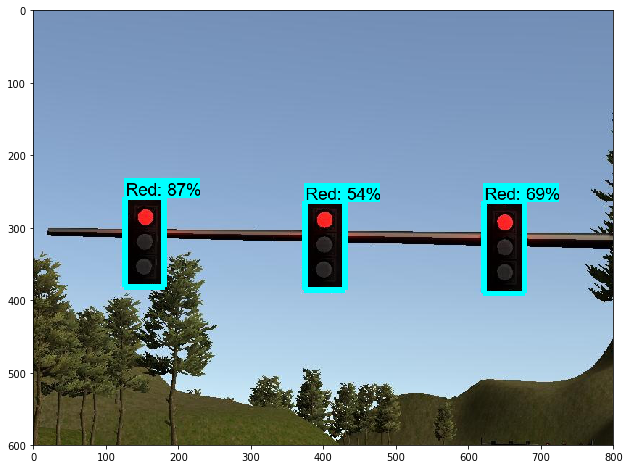

SCORES
[0.99986756 0.9993556  0.99926895 0.01360683 0.00451216 0.00375626
 0.00368379 0.00368281 0.00341793 0.00336384]
CLASSES
[2. 2. 2. 2. 3. 4. 4. 3. 4. 1.]


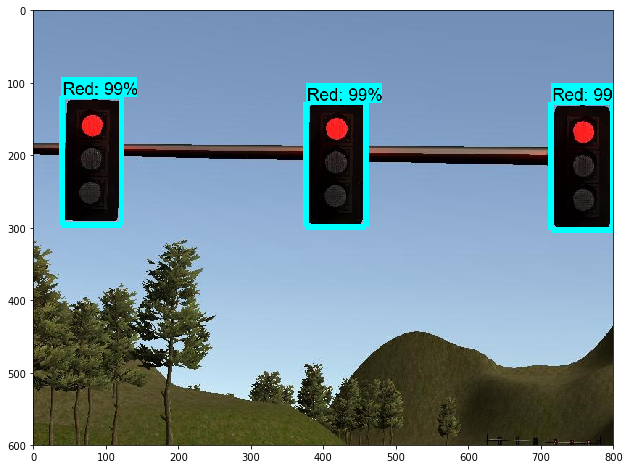

SCORES
[0.9833998  0.9800789  0.90595406 0.0090929  0.00900325 0.00847401
 0.00806047 0.00743175 0.00668024 0.00644918]
CLASSES
[2. 2. 2. 2. 2. 2. 4. 4. 4. 2.]


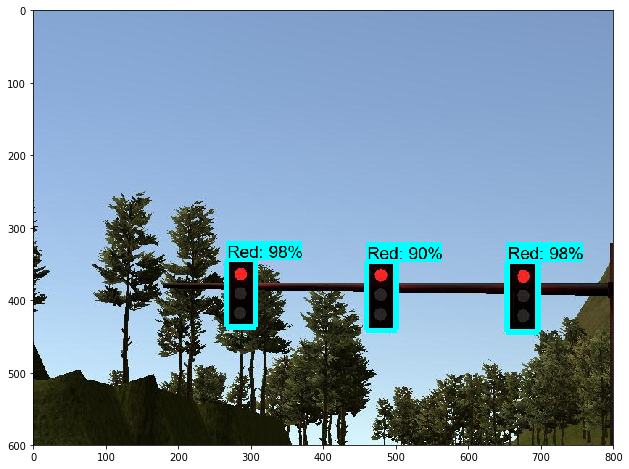

SCORES
[0.97213686 0.95820266 0.91111463 0.01465018 0.01158628 0.00986224
 0.00893122 0.00856399 0.00793168 0.00755841]
CLASSES
[3. 3. 3. 3. 3. 3. 3. 3. 3. 3.]


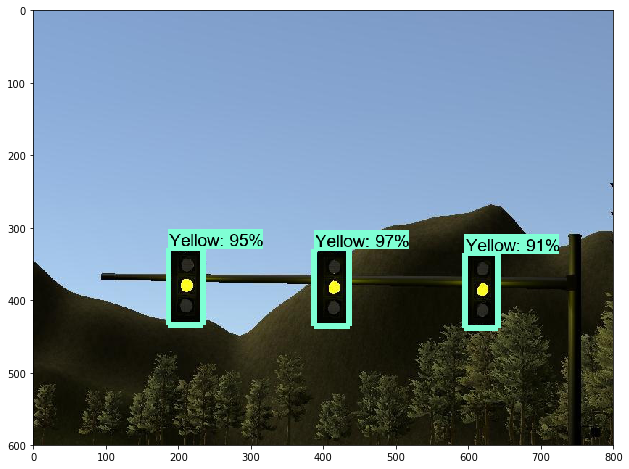

SCORES
[0.9406795  0.83226395 0.6634251  0.00571683 0.0056508  0.00538164
 0.00533659 0.00530132 0.0051292  0.0050456 ]
CLASSES
[2. 2. 2. 2. 2. 4. 4. 2. 2. 2.]


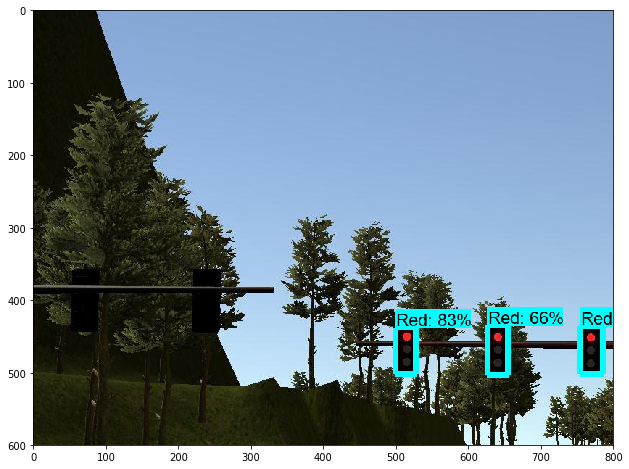

SCORES
[0.9724113  0.88804215 0.72369814 0.00637769 0.00591795 0.0056154
 0.00534187 0.00532989 0.00532218 0.00518798]
CLASSES
[2. 2. 2. 1. 2. 1. 4. 2. 3. 2.]


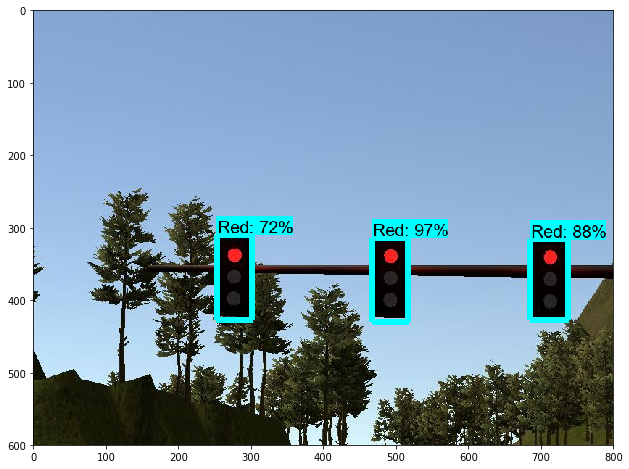

In [11]:
PATH_TO_IMGS = r'data/simulator_dataset_rgb'
subfolder = ['Green', 'Red', 'Yellow', 'Unknown']
TEST_IMGS = []
for i in subfolder:
    TEST_IMGS += glob(os.path.join(os.path.join(PATH_TO_IMGS, i), r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break